### Solve the wave equation and estimate the wave velocity using PINNs (2/2). 
In the previous notebook we have solved the wavefield $p(x,y,t)$ for a known $c$ given the inital and boundary conditions and some observed data. Let's try now to estimate the wave velocity field $c(x,y)$ using a second PINN. 

We start by definig a more complex velocity field, with an ellipse-shaped inhomogeneity. We then compute the reference wavefield. 

In [45]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import tqdm
from seismic_cpml.seismic_CPML_2D_pressure_second_order import seismicCPML2D

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [46]:
class FCN(nn.Module):
        def __init__(self, n_in, n_out, n_ffeatures, n_hidden, n_layers):
            super().__init__()
            self.n_ffeatures = n_ffeatures
            if n_ffeatures != 0:
                self.B = torch.nn.Parameter(torch.randn((n_in, n_ffeatures)))
                self.b = torch.nn.Parameter(torch.randn((1, n_ffeatures)))
                n_in = n_ffeatures

            activation = nn.Tanh
            self.fcs = nn.Sequential(*[
                            nn.Linear(n_in, n_hidden),
                            activation()])
            self.fch = nn.Sequential(*[
                            nn.Sequential(*[
                                nn.Linear(n_hidden, n_hidden),
                                activation()]) for _ in range(n_layers-1)])
            self.fce = nn.Linear(n_hidden, n_out)

        def forward(self, r):
            if self.n_ffeatures != 0:
                r = torch.cos( 2*np.pi*r @ self.B + self.b ) # Fourier mapping
            r = self.fcs(r)
            r = self.fch(r)
            r = self.fce(r)
            return r
        
def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_normal_(m.weight)
        torch.nn.init.zeros_(m.bias)

def pde(p, r, c):
    p_r = torch.autograd.grad(p, r, torch.ones_like(p), create_graph=True)[0]
    p_xx = torch.autograd.grad(p_r[:,0], r, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
    p_yy = torch.autograd.grad(p_r[:,1], r, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
    p_tt = torch.autograd.grad(p_r[:,2], r, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,2:3]
    pde_res = p_xx + p_yy - p_tt/c**2
    return pde_res

def absorbing_boundary(p, r_bound, id_bound, c):
    p_r = torch.autograd.grad(p, r_bound, torch.ones_like(p), create_graph=True)[0]
    p_tt = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,2:3]
    if id_bound == 1:
        p_ty = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,1:2]
        p_xx = torch.autograd.grad(p_r[:,0], r_bound, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
        res_bound = -p_ty + p_tt/c - c*p_xx/2
    elif id_bound == 2:
        p_ty = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,1:2]
        p_xx = torch.autograd.grad(p_r[:,0], r_bound, torch.ones_like(p_r[:,0]), create_graph=True)[0][:,0:1]
        res_bound = p_ty + p_tt/c - c*p_xx/2
    elif id_bound == 3:
        p_tx = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,0:1]
        p_yy = torch.autograd.grad(p_r[:,1], r_bound, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
        res_bound = -p_tx + p_tt/c - c*p_yy/2
    elif id_bound == 4:
        p_tx = torch.autograd.grad(p_r[:,2], r_bound, torch.ones_like(p_r[:,2]), create_graph=True)[0][:,0:1]
        p_yy = torch.autograd.grad(p_r[:,1], r_bound, torch.ones_like(p_r[:,1]), create_graph=True)[0][:,1:2]
        res_bound = p_tx + p_tt/c - c*p_yy/2
    return res_bound

def loss_grad_norm(loss, model):
    loss_grad_norm = 0
    loss_clone = loss.clone()
    for params in model.parameters():
        loss_grad = torch.autograd.grad(loss_clone, params, retain_graph=True, allow_unused=True, materialize_grads=True)[0]
        loss_grad_norm += torch.sum(loss_grad**2)
    loss_grad_norm = loss_grad_norm**0.5
    loss_grad_norm = loss_grad_norm.detach().numpy()
    return loss_grad_norm

def update_lambda(model, loss_lst, lamb_lst, alpha):
    grad = []
    for loss in loss_lst:
        grad.append(loss_grad_norm(loss, model))
    grad_sum = sum(grad)
    lamb = []
    for i in range(len(grad)):
        lamb_hat = grad_sum / grad[i]
        if np.isnan(lamb_hat) or np.isinf(lamb_hat):
            lamb_hat = 1
        lamb_new = np.min((alpha*lamb_lst[i] + (1-alpha)*lamb_hat, 1e6))
        lamb.append(lamb_new)
    return lamb

def xyt_tensor(rxy, t):
    n_t = len(t)
    n_xy = len(rxy)
    r = np.column_stack(
        (np.repeat(rxy, n_t, axis=0),
         np.tile(t, n_xy)))
    r = torch.tensor(r, dtype=torch.float32).view(-1,3).requires_grad_(True)
    r = r.to(device)
    return r

def rand_colloc(L, T, n):
    xy = L * np.random.rand(n, 2)
    t = T * np.random.rand(n)
    r = xyt_tensor(xy, t)
    return r

def rand_bound(L, T, n, id_bound):
    t = T * np.random.rand(n)
    rand = L*np.random.rand(n)
    if id_bound == 1:
        xy = np.column_stack((rand, np.zeros(n)))
    elif id_bound == 2:
        xy = np.column_stack((rand, L*np.ones(n)))
    elif id_bound == 3:
        xy = np.column_stack((np.zeros(n), rand))
    elif id_bound == 4:
        xy = np.column_stack((rand, np.zeros(n)))
    r = xyt_tensor(xy, t)
    return r

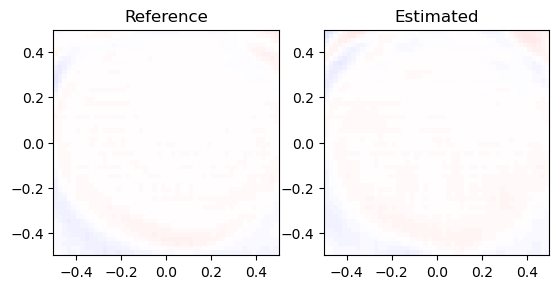

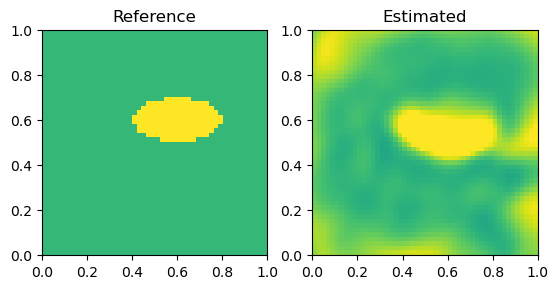

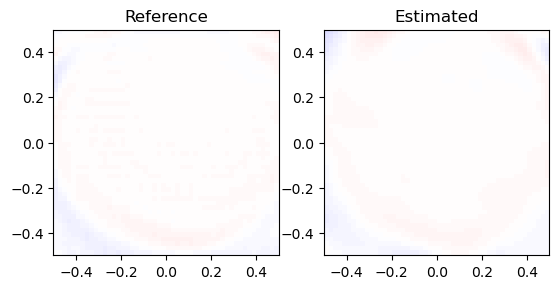

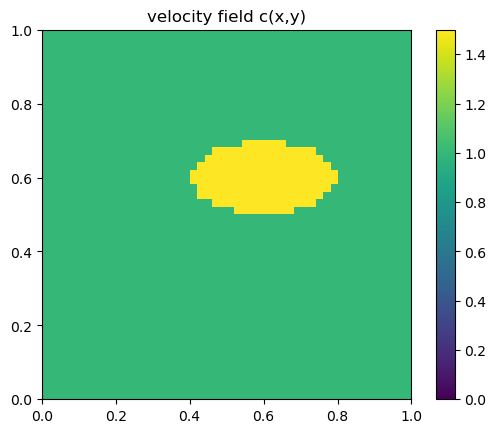

In [47]:
# define domain
L = 10
T = 4
rho = 1
dtype = np.float32

# velocity
c = 3

# scaling
T = T*c/L
L = L/L
c = 1

# define simulation domain
n_T = 150
t = np.linspace(0, T, n_T)
delta_T = t[1]

n_L = 50
r_side = np.linspace(0, L, n_L)
delta_L = r_side[1]
x, y = np.meshgrid(r_side, r_side)
r = np.column_stack((np.reshape(x,(-1,1)), np.reshape(y,(-1,1))))
r_ref = xyt_tensor(r, t)

rho_field = rho*np.ones(shape=(n_L, n_L), dtype=dtype)
c_field = c*np.ones(shape=(n_L, n_L), dtype=dtype)
# ellipse-shaped inhomogeneity
ind_ellipse = ((x-0.6)/0.2)**2 + ((y-0.6)/0.1)**2 <= 1
c_field[ind_ellipse] = 1.5

fig, ax = plt.subplots()
im = ax.imshow(c_field, vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L])
ax.set_title('velocity field c(x,y)')
fig.colorbar(im, ax=ax)
plt.show()

# initial condition
gpulse_std = 5e-2
r_source = np.array([0.1, 0.1])
p0 = np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))
r_source = np.array([0.3, 0.1])
p0 = p0+np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))
r_source = np.array([0.5, 0.1])
p0 = p0+np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))
r_source = np.array([0.7, 0.1])
p0 = p0+np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))
r_source = np.array([0.9, 0.1])
p0 = p0+np.exp(-0.5*( ((x-r_source[0])/gpulse_std)**2 + ((y-r_source[1])/gpulse_std)**2 ))

# for the PML
n_PML = 20
f0 = 0.25 
p0 = np.pad(p0, [(n_PML, n_PML), (n_PML, n_PML)], mode="edge")
c_field = np.pad(c_field, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")
rho_field = np.pad(rho_field, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")

# compute reference field
p_ref, _ = seismicCPML2D(
                n_L+2*n_PML,
                n_L+2*n_PML,
                n_T,
                delta_L,
                delta_L,
                delta_T,
                n_PML,
                c_field,
                rho_field,
                (p0.copy(),p0.copy()),
                f0,
                dtype,
                output_wavefields=True,
                gather_is=None)

# remove PML
p_ref = p_ref[:,n_PML:-n_PML, n_PML:-n_PML]
p_ref = np.moveaxis(p_ref, 0, -1)
c_field = c_field[n_PML:-n_PML, n_PML:-n_PML]
rho_field = rho_field[n_PML:-n_PML, n_PML:-n_PML]

# plot reference field (it might take a few seconds)
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
p_max = np.max(np.abs(p_ref))
frames = []
fig, [ax1, ax2] = plt.subplots(1, 2, gridspec_kw={"width_ratios":[50,1]})
cmap = matplotlib.cm.seismic
norm = matplotlib.colors.Normalize(vmin=-p_max, vmax=p_max)
cbar = matplotlib.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, orientation='vertical')
ax1.set_title('reference pressure')
for i in range(n_T):   
    p_plot = p_ref[:,:,i]
    img = ax1.imshow(p_plot, vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L], animated=True)
    frames.append([img])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

And again we compute the reference field and get the observed data. 

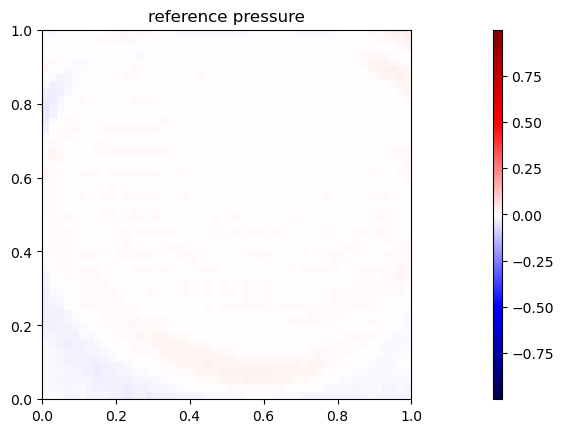

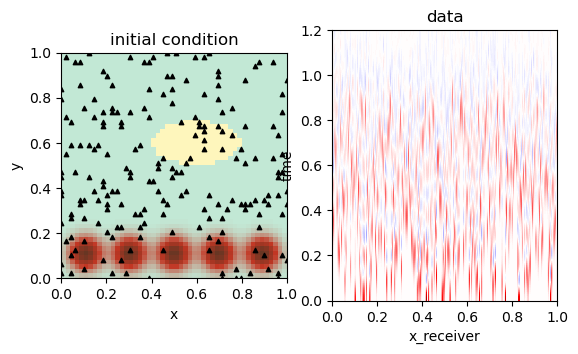

In [48]:
n_data = 200
ind_xy = np.random.choice(n_L**2, n_data, replace=False)
x_data = x.reshape(-1,1)[ind_xy]
y_data = y.reshape(-1,1)[ind_xy]
r_data = np.column_stack((x_data, y_data))
r_data = xyt_tensor(r_data, t)
p_data = torch.tensor(p_ref.reshape(-1,n_T)[ind_xy,:], dtype=torch.float32)

# Plot data
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.set_title('initial condition')
ax2.set_title('data')
ax1.set_ylabel('y')
ax1.set_xlabel('x')
ax2.set_ylabel('time')
ax2.set_xlabel('receiver')
ax1.imshow(p_ref[:,:,0], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,L])
ax1.imshow(c_field, alpha=0.3, vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L])

ax1.scatter(x_data, y_data, s=10, c='black', marker='^')
ax2.imshow(p_data.T, vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[0,L,0,T])
plt.show()

p_data = p_data.to(device)

# Initial condition
t_ini = t[0:2]
r_ini = xyt_tensor(r, t_ini)
p_ini = p_ref[:,:,0:2].reshape(-1,2)
p_ini = torch.tensor(p_ini, dtype=torch.float32, device=device)


### PINNs
 We define two NNs, `model_p` with inputs $(x,y,t)$ will learn the pressure field $p(x,y,t)$, and `model_c` with inputs $(x,y)$ will learn the velocity field $c(x,y)$. The number of layers, hidden units, etc. do not need to be the same for the two NNs (`model_c` could actually be smaller as the function $c$ is not as complex as $p$).

To initialise `model_c` we could have a guess of how the veloctiy field might look like, $c_0$ and pre-train that network. In our case, our guess is that the velocity is constant with value 1. If we have a guess $c_0$, we could also train `model_c` differently, so that the NN learns not the velocity field $c(x,y)$ but the difference $c_\text{res} = c-c_0$. Let's try with the first option, i.e. `model_c` learns $c(x,y)$

In [49]:
n_in = 3
n_out = 1
n_ffeatures = 64
n_hidden = 64
n_layers = 3
n_colloc = 20
n_lamb_update = 100
n_warmup = 0
n_bound = 5
n_epochs = int(5e4)
c_0 = 1
lamb = [1, 1, 1, 1] # initialise lambdas

model_p = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model_p = model_p.to(device)
model_p.apply(weights_init)

model_c = FCN(n_in-1, n_out, n_ffeatures, n_hidden, n_layers)
model_c = model_c.to(device)
model_c.apply(weights_init)

mse_loss = nn.MSELoss()
optimiser_p = torch.optim.Adam(model_p.parameters(), lr=1e-4)
optimiser_c = torch.optim.Adam(model_c.parameters(), lr=1e-4)

for i in tqdm(range(int(1e4))):
    optimiser_c.zero_grad()
    xy_colloc = L * np.random.rand(n_colloc, 2)
    xy_colloc = torch.tensor(xy_colloc, dtype=torch.float32).view(-1,2).requires_grad_(True)
    c_res = model_c(xy_colloc)
    c = model_c(xy_colloc)
    loss_c = mse_loss(c, c_0*torch.ones_like(c))
    loss_c.backward()
    optimiser_c.step()

loss_data_hist = []
loss_pde_hist = []
loss_ini_hist = []
loss_bound_hist = []
lamb_data_hist = []
lamb_pde_hist = []
lamb_ini_hist = []
lamb_bound_hist = []
c_hist = []
xy_ref = torch.tensor(r, dtype=torch.float32)

100%|██████████| 10000/10000 [00:15<00:00, 646.75it/s]


In [50]:
for i in tqdm(range(n_epochs)):
    optimiser_p.zero_grad()
    optimiser_c.zero_grad()

    # initial condition loss
    p = model_p(r_ini)
    p = p.reshape(-1, 2)
    loss_ini = mse_loss(p, p_ini)

    # absorbing boundary conditions
    loss_bound = torch.zeros_like(loss_ini).requires_grad_(True)
    for j in range(4):
        r_bound = rand_bound(L, T, n_bound, j+1)
        p = model_p(r_bound)
        c = model_c(r_bound[:,0:2])
        res_bound = absorbing_boundary(p, r_bound, j+1, c)
        loss_bound = loss_bound + mse_loss(res_bound, torch.zeros_like(res_bound))

    # data loss
    p = model_p(r_data)
    p = p.reshape(-1, n_T)
    loss_data = mse_loss(p, p_data)

    # pde loss
    xy_colloc = L * np.random.rand(n_colloc, 2)
    t_colloc = T * np.random.rand(n_colloc)
    r_colloc = xyt_tensor(xy_colloc, t_colloc)
    p = model_p(r_colloc)
    c = model_c(r_colloc[:,0:2])
    pde_res = pde(p, r_colloc, c)
    loss_pde = mse_loss(pde_res, torch.zeros_like(p))

    loss_lst = [loss_data, loss_pde, loss_ini, loss_bound]

    # get gradients and update lambda
    if i % n_lamb_update == 0: 
        lamb = update_lambda(model_p, loss_lst, lamb, 0.9)

    # total loss
    loss = loss_data + loss_pde*lamb[1]/lamb[0] + loss_ini*lamb[2]/lamb[0] + loss_bound*lamb[3]/lamb[0] 

    # backpropagate
    loss.backward()
    optimiser_p.step()
    if i >= n_warmup:
        optimiser_c.step()

    # log
    loss_data_hist.append(loss_data.numpy(force=True))
    loss_pde_hist.append(loss_pde.numpy(force=True))
    loss_ini_hist.append(loss_ini.numpy(force=True))
    loss_bound_hist.append(loss_bound.numpy(force=True))
    lamb_data_hist.append(lamb[0])
    lamb_pde_hist.append(lamb[1])
    lamb_ini_hist.append(lamb[2])
    lamb_bound_hist.append(lamb[3])

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss.item()*1e3))
    if i % 1000 == 999:
        with torch.no_grad():
            c_est = model_c(xy_ref)
            c_est = np.reshape(c_est.detach().numpy(), (n_L, n_L))
            c_hist.append(c_est)

  1%|          | 500/50000 [00:25<39:31, 20.87it/s]

[  500] loss: 46.940*1e-3


  2%|▏         | 1002/50000 [00:49<45:51, 17.81it/s]

[ 1000] loss: 23.913*1e-3


  3%|▎         | 1500/50000 [01:13<36:50, 21.94it/s]

[ 1500] loss: 16.518*1e-3


  4%|▍         | 2000/50000 [01:37<38:50, 20.60it/s]

[ 2000] loss: 12.470*1e-3


  5%|▌         | 2502/50000 [02:02<44:59, 17.59it/s]

[ 2500] loss: 9.889*1e-3


  6%|▌         | 3000/50000 [02:27<36:20, 21.56it/s]

[ 3000] loss: 8.769*1e-3


  7%|▋         | 3502/50000 [02:52<46:32, 16.65it/s]

[ 3500] loss: 7.377*1e-3


  8%|▊         | 4000/50000 [03:16<36:21, 21.09it/s]

[ 4000] loss: 6.512*1e-3


  9%|▉         | 4502/50000 [03:42<47:22, 16.01it/s]

[ 4500] loss: 6.199*1e-3


 10%|█         | 5002/50000 [04:06<42:55, 17.47it/s]

[ 5000] loss: 5.178*1e-3


 11%|█         | 5501/50000 [04:31<42:15, 17.55it/s]

[ 5500] loss: 4.719*1e-3


 12%|█▏        | 6000/50000 [04:56<34:17, 21.39it/s]

[ 6000] loss: 4.288*1e-3


 13%|█▎        | 6501/50000 [05:20<41:44, 17.37it/s]

[ 6500] loss: 3.685*1e-3


 14%|█▍        | 7001/50000 [05:45<42:51, 16.72it/s]

[ 7000] loss: 3.340*1e-3


 15%|█▌        | 7502/50000 [06:09<39:36, 17.88it/s]

[ 7500] loss: 3.099*1e-3


 16%|█▌        | 8000/50000 [06:34<38:05, 18.38it/s]

[ 8000] loss: 2.601*1e-3


 17%|█▋        | 8501/50000 [06:59<50:14, 13.77it/s]

[ 8500] loss: 2.470*1e-3


 18%|█▊        | 9000/50000 [07:23<32:15, 21.19it/s]

[ 9000] loss: 2.427*1e-3


 19%|█▉        | 9500/50000 [07:47<32:00, 21.09it/s]

[ 9500] loss: 2.343*1e-3


 20%|██        | 10002/50000 [08:12<44:41, 14.92it/s]

[10000] loss: 2.029*1e-3


 21%|██        | 10502/50000 [08:37<41:22, 15.91it/s]

[10500] loss: 1.995*1e-3


 22%|██▏       | 11000/50000 [09:02<30:59, 20.98it/s]

[11000] loss: 1.927*1e-3


 23%|██▎       | 11502/50000 [09:26<37:22, 17.17it/s]

[11500] loss: 1.780*1e-3


 24%|██▍       | 12001/50000 [09:52<39:54, 15.87it/s]

[12000] loss: 1.682*1e-3


 25%|██▌       | 12502/50000 [10:16<36:44, 17.01it/s]

[12500] loss: 1.546*1e-3


 26%|██▌       | 13002/50000 [10:40<36:33, 16.87it/s]

[13000] loss: 1.317*1e-3


 27%|██▋       | 13501/50000 [11:05<35:16, 17.24it/s]

[13500] loss: 1.134*1e-3


 28%|██▊       | 14001/50000 [11:30<34:02, 17.62it/s]

[14000] loss: 1.336*1e-3


 29%|██▉       | 14500/50000 [11:54<28:00, 21.12it/s]

[14500] loss: 1.305*1e-3


 30%|███       | 15001/50000 [12:19<43:02, 13.55it/s]

[15000] loss: 1.249*1e-3


 31%|███       | 15501/50000 [12:43<38:08, 15.08it/s]

[15500] loss: 1.147*1e-3


 32%|███▏      | 15999/50000 [13:08<26:33, 21.34it/s]

[16000] loss: 1.299*1e-3


 33%|███▎      | 16501/50000 [13:33<32:10, 17.35it/s]

[16500] loss: 1.513*1e-3


 34%|███▍      | 17002/50000 [13:57<31:21, 17.54it/s]

[17000] loss: 1.126*1e-3


 35%|███▌      | 17501/50000 [14:22<31:33, 17.17it/s]

[17500] loss: 0.966*1e-3


 36%|███▌      | 18001/50000 [14:46<35:00, 15.23it/s]

[18000] loss: 1.057*1e-3


 37%|███▋      | 18500/50000 [15:10<23:39, 22.19it/s]

[18500] loss: 0.929*1e-3


 38%|███▊      | 19001/50000 [15:34<28:55, 17.86it/s]

[19000] loss: 0.956*1e-3


 39%|███▉      | 19501/50000 [15:57<27:39, 18.38it/s]

[19500] loss: 0.867*1e-3


 40%|████      | 20002/50000 [16:20<27:35, 18.12it/s]

[20000] loss: 1.532*1e-3


 41%|████      | 20500/50000 [16:42<22:06, 22.25it/s]

[20500] loss: 0.974*1e-3


 42%|████▏     | 21001/50000 [17:06<26:31, 18.22it/s]

[21000] loss: 0.815*1e-3


 43%|████▎     | 21502/50000 [17:29<25:59, 18.27it/s]

[21500] loss: 0.791*1e-3


 44%|████▍     | 22000/50000 [17:52<20:57, 22.26it/s]

[22000] loss: 0.856*1e-3


 45%|████▌     | 22501/50000 [18:15<25:20, 18.09it/s]

[22500] loss: 1.099*1e-3


 46%|████▌     | 23000/50000 [18:38<20:37, 21.82it/s]

[23000] loss: 1.124*1e-3


 47%|████▋     | 23500/50000 [19:01<20:03, 22.02it/s]

[23500] loss: 0.982*1e-3


 48%|████▊     | 24001/50000 [19:26<24:43, 17.52it/s]

[24000] loss: 0.747*1e-3


 49%|████▉     | 24500/50000 [19:50<19:43, 21.54it/s]

[24500] loss: 0.841*1e-3


 50%|█████     | 25001/50000 [20:14<23:38, 17.63it/s]

[25000] loss: 0.699*1e-3


 51%|█████     | 25501/50000 [20:39<23:22, 17.47it/s]

[25500] loss: 0.963*1e-3


 52%|█████▏    | 26000/50000 [21:02<18:26, 21.70it/s]

[26000] loss: 0.747*1e-3


 53%|█████▎    | 26500/50000 [21:27<20:07, 19.46it/s]

[26500] loss: 0.747*1e-3


 54%|█████▍    | 26999/50000 [21:51<18:24, 20.83it/s]

[27000] loss: 0.742*1e-3


 55%|█████▌    | 27500/50000 [22:16<18:19, 20.47it/s]

[27500] loss: 1.302*1e-3


 56%|█████▌    | 28002/50000 [22:40<20:18, 18.05it/s]

[28000] loss: 0.863*1e-3


 57%|█████▋    | 28501/50000 [23:04<19:58, 17.94it/s]

[28500] loss: 0.661*1e-3


 58%|█████▊    | 29002/50000 [23:28<19:23, 18.04it/s]

[29000] loss: 0.604*1e-3


 59%|█████▉    | 29501/50000 [23:52<24:28, 13.96it/s]

[29500] loss: 0.677*1e-3


 60%|██████    | 30002/50000 [24:16<18:46, 17.75it/s]

[30000] loss: 0.663*1e-3


 61%|██████    | 30502/50000 [24:39<18:08, 17.91it/s]

[30500] loss: 0.609*1e-3


 62%|██████▏   | 31000/50000 [25:03<14:35, 21.69it/s]

[31000] loss: 0.789*1e-3


 63%|██████▎   | 31501/50000 [25:27<17:02, 18.09it/s]

[31500] loss: 0.676*1e-3


 64%|██████▍   | 32000/50000 [25:51<13:36, 22.04it/s]

[32000] loss: 0.527*1e-3


 65%|██████▌   | 32501/50000 [26:15<17:56, 16.25it/s]

[32500] loss: 0.579*1e-3


 66%|██████▌   | 33001/50000 [26:38<15:33, 18.20it/s]

[33000] loss: 0.673*1e-3


 67%|██████▋   | 33502/50000 [27:02<15:29, 17.74it/s]

[33500] loss: 0.523*1e-3


 68%|██████▊   | 34000/50000 [27:27<13:51, 19.23it/s]

[34000] loss: 0.511*1e-3


 69%|██████▉   | 34501/50000 [27:51<14:06, 18.31it/s]

[34500] loss: 0.649*1e-3


 70%|███████   | 35001/50000 [28:15<13:52, 18.02it/s]

[35000] loss: 0.812*1e-3


 71%|███████   | 35500/50000 [28:38<10:55, 22.12it/s]

[35500] loss: 0.687*1e-3


 72%|███████▏  | 36000/50000 [29:02<10:23, 22.47it/s]

[36000] loss: 0.655*1e-3


 73%|███████▎  | 36501/50000 [29:25<13:34, 16.58it/s]

[36500] loss: 0.564*1e-3


 74%|███████▍  | 37001/50000 [29:49<11:58, 18.08it/s]

[37000] loss: 0.657*1e-3


 75%|███████▌  | 37500/50000 [30:12<09:16, 22.47it/s]

[37500] loss: 0.515*1e-3


 76%|███████▌  | 38000/50000 [30:35<09:56, 20.13it/s]

[38000] loss: 0.705*1e-3


 77%|███████▋  | 38501/50000 [30:59<10:07, 18.92it/s]

[38500] loss: 0.717*1e-3


 78%|███████▊  | 39001/50000 [31:22<11:05, 16.53it/s]

[39000] loss: 0.504*1e-3


 79%|███████▉  | 39502/50000 [31:45<09:28, 18.47it/s]

[39500] loss: 0.470*1e-3


 80%|████████  | 40001/50000 [32:08<09:25, 17.68it/s]

[40000] loss: 0.474*1e-3


 81%|████████  | 40502/50000 [32:32<09:00, 17.59it/s]

[40500] loss: 0.543*1e-3


 82%|████████▏ | 41000/50000 [32:56<06:28, 23.16it/s]

[41000] loss: 0.759*1e-3


 83%|████████▎ | 41502/50000 [33:21<09:03, 15.65it/s]

[41500] loss: 0.486*1e-3


 84%|████████▍ | 42001/50000 [33:46<07:13, 18.45it/s]

[42000] loss: 0.444*1e-3


 85%|████████▌ | 42500/50000 [34:09<05:51, 21.35it/s]

[42500] loss: 0.490*1e-3


 86%|████████▌ | 43002/50000 [34:32<06:18, 18.50it/s]

[43000] loss: 0.762*1e-3


 87%|████████▋ | 43502/50000 [34:56<05:48, 18.63it/s]

[43500] loss: 0.522*1e-3


 88%|████████▊ | 44000/50000 [35:19<04:21, 22.95it/s]

[44000] loss: 0.659*1e-3


 89%|████████▉ | 44501/50000 [35:43<05:34, 16.45it/s]

[44500] loss: 0.697*1e-3


 90%|████████▉ | 44999/50000 [36:06<04:00, 20.80it/s]

[45000] loss: 0.428*1e-3


 91%|█████████ | 45502/50000 [36:30<04:11, 17.85it/s]

[45500] loss: 0.537*1e-3


 92%|█████████▏| 46002/50000 [36:54<04:19, 15.41it/s]

[46000] loss: 0.415*1e-3


 93%|█████████▎| 46502/50000 [37:17<03:14, 17.95it/s]

[46500] loss: 0.469*1e-3


 94%|█████████▍| 47000/50000 [37:40<02:18, 21.64it/s]

[47000] loss: 0.610*1e-3


 95%|█████████▌| 47501/50000 [38:04<02:32, 16.44it/s]

[47500] loss: 0.477*1e-3


 96%|█████████▌| 48002/50000 [38:26<01:50, 18.06it/s]

[48000] loss: 0.495*1e-3


 97%|█████████▋| 48500/50000 [38:49<01:06, 22.55it/s]

[48500] loss: 0.426*1e-3


 98%|█████████▊| 49001/50000 [39:12<00:57, 17.43it/s]

[49000] loss: 0.496*1e-3


 99%|█████████▉| 49501/50000 [39:35<00:26, 18.82it/s]

[49500] loss: 0.502*1e-3


100%|██████████| 50000/50000 [39:57<00:00, 20.85it/s]

[50000] loss: 0.572*1e-3


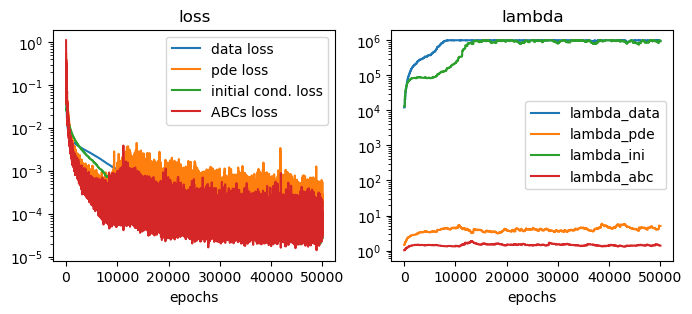

In [51]:
# Plot loss and lambda
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8, 3))
ax1.title.set_text('loss')
ax1.plot(loss_data_hist, label="data loss")
ax1.plot(np.asarray(loss_pde_hist)*np.asarray(lamb_pde_hist)/np.asarray(lamb_data_hist), label="pde loss")
ax1.plot(np.asarray(loss_ini_hist)*np.asarray(lamb_ini_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")
ax1.plot(np.asarray(loss_bound_hist)*np.asarray(lamb_bound_hist)/np.asarray(lamb_data_hist), label="ABCs loss")

ax1.legend()
ax1.set_yscale("log")   
ax1.set_xlabel("epochs")
ax2.title.set_text('lambda')
ax2.plot(lamb_data_hist, label="lambda_data")
ax2.plot(lamb_pde_hist, label="lambda_pde")
ax2.plot(lamb_ini_hist, label="lambda_ini")
ax2.plot(lamb_bound_hist, label="lambda_abc")
ax2.legend()
ax2.set_yscale("log")   
ax2.set_xlabel("epochs")
plt.show()

In [52]:
# Plot reference and estimation
p_est = model_p(r_ref)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T))
p_max = np.max(np.abs(p_ref))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, n_T):   
    img1 = ax1.imshow(p_ref[:,:,i], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img2 = ax2.imshow(np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

In [53]:
plt.close()

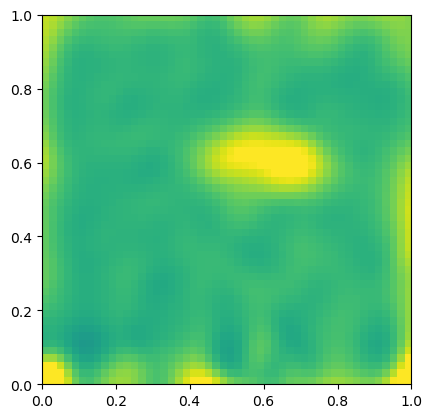

In [54]:
xy_ref = torch.tensor(r, dtype=torch.float32)
c_est = model_c(xy_ref)
c_est = np.reshape(c_est.cpu().detach().numpy(), (n_L, n_L))

fig, ax = plt.subplots()
ax.imshow(np.reshape(c_est, (n_L, n_L)), vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L], animated=True)
plt.show()

In [55]:
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, len(c_hist)):   
    img1 = ax1.imshow(c_field, vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L])
    img2 = ax2.imshow(np.reshape(c_hist[i], (n_L, n_L)), vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

### PDE numerical solver
We can see that the inhomogeneity can be learned, although is kind of blurred. We can also see that the velocity is overestimated in the boundaries (maybe that has to do with the ABCs). 

Instead of just relying in two PINNs to solve the forward and inverse problem, another possibility is to include a numerical PDE solver in the trainig loop. This falls within the umbrella of the so-called *hybrid methods*. The difference with PINNs is that the NN is not learning the *solution* to the PDE, but a *part* of the PDE. Things get even more interesting when we have a differentiable PDE solver, so that the NN can interact with it while traning (see [Um 2021] https://doi.org/10.48550/arXiv.2007.00016). This last thing will hopefully come in a future notebook. 

We start with a *naive* hybrid method: we use a numerical solver, `seismicCPML2D`, which solves the wave equation with our initial guess velocity $c_0$ (e.g., just a constant), and gives us the pressure field $p_0(x,y,t)$. The output of the first NN, `model_p`, is the *residual* pressure field, $p_\text{res}(x,y,t)$, so that $p = p_0 + p_\text{res}$. In this way the NN focuses on what we are uncertain about and not on modeling the propagation where we know how the wave propagates. Sice we are dealing with the linear wave equation, the sum $p = p_0 + p_\text{res}$ makes sense, and $p_\text{res}$ also satisfies the wave equation (and BCs?). 

In [56]:
c0 = np.ones(shape=(n_L, n_L), dtype=dtype)
c0 = np.pad(c0, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")
rho_field = rho*np.ones(shape=(n_L, n_L), dtype=dtype)
rho_field = np.pad(rho_field, [(n_PML, n_PML),(n_PML, n_PML)], mode="edge")
p_c0, _ = seismicCPML2D(
                n_L+2*n_PML,
                n_L+2*n_PML,
                n_T,
                delta_L,
                delta_L,
                delta_T,
                n_PML,
                c0,
                rho_field,
                (p0.copy(),p0.copy()),
                f0,
                dtype,
                output_wavefields=True,
                gather_is=None)
p_c0 = p_c0[:,n_PML:-n_PML, n_PML:-n_PML]
p_c0 = np.moveaxis(p_c0, 0, -1)
p_ind = torch.tensor(p_c0.reshape(-1, n_T)[ind_xy,:], dtype=torch.float32)
c0 = c0[n_PML:-n_PML, n_PML:-n_PML]
p_c0 = torch.Tensor(p_c0)

n_in = 3
n_out = 1
n_ffeatures = 64
n_hidden = 64
n_layers = 3
n_colloc = 20
n_lamb_update = 100
n_warmup = 0
n_bound = 5
n_epochs = int(5e4)
# lamb = [1, 1, 1, 1] # initialise lambdas
lamb = [1, 1] # initialise lambdas

model_p = FCN(n_in, n_out, n_ffeatures, n_hidden, n_layers)
model_p = model_p.to(device)
model_p.apply(weights_init)

model_c = FCN(n_in-1, n_out, n_ffeatures, n_hidden, n_layers)
model_c = model_c.to(device)
model_c.apply(weights_init)

mse_loss = nn.MSELoss()
optimiser_p = torch.optim.Adam(model_p.parameters(), lr=1e-4)
optimiser_c = torch.optim.Adam(model_c.parameters(), lr=1e-4)

for i in tqdm(range(int(1e4))):
    optimiser_c.zero_grad()
    xy_colloc = L * np.random.rand(n_colloc, 2)
    xy_colloc = torch.tensor(xy_colloc, dtype=torch.float32).view(-1,2).requires_grad_(True)
    c = model_c(xy_colloc)
    loss_c = mse_loss(c, torch.ones_like(c))
    loss_c.backward()
    optimiser_c.step()

loss_data_hist = []
loss_pde_hist = []
# loss_ini_hist = []
# loss_bound_hist = []
lamb_data_hist = []
lamb_pde_hist = []
# lamb_ini_hist = []
# lamb_bound_hist = []
c_hist = []
xy_ref = torch.tensor(r, dtype=torch.float32)

100%|██████████| 10000/10000 [00:13<00:00, 730.41it/s]


In [57]:
for i in tqdm(range(n_epochs)):
    optimiser_p.zero_grad()
    optimiser_c.zero_grad()

    # # initial condition loss
    # p_res = model_p(r_ini)
    # p_res = p_res.reshape(-1, 2)
    # loss_ini = mse_loss(p_res, torch.zeros_like(p_res))

    # # absorbing boundary conditions
    # loss_bound = torch.zeros_like(loss_ini).requires_grad_(True)
    # for j in range(4):
    #     r_bound = rand_bound(L, T, n_bound, j+1)
    #     p_res = model_p(r_bound)
    #     c = model_c(r_bound[:,0:2])
    #     res_bound = absorbing_boundary(p_res, r_bound, j+1, c)
    #     loss_bound = loss_bound + mse_loss(res_bound, torch.zeros_like(res_bound))

    # data loss
    p_res = model_p(r_data)
    p_res = p_res.reshape(-1, n_T)
    p = p_ind + p_res
    loss_data = mse_loss(p, p_data)

    # pde loss
    xy_colloc = L * np.random.rand(n_colloc, 2)
    t_colloc = T * np.random.rand(n_colloc)
    r_colloc = xyt_tensor(xy_colloc, t_colloc)
    p_res = model_p(r_colloc)
    c = model_c(r_colloc[:,0:2])
    pde_res = pde(p_res, r_colloc, c)
    loss_pde = mse_loss(pde_res, torch.zeros_like(p_res))

    # loss_lst = [loss_data, loss_pde, loss_ini, loss_bound]
    loss_lst = [loss_data, loss_pde]

    # get gradients and update lambda
    if i % n_lamb_update == 0: 
        lamb = update_lambda(model_p, loss_lst, lamb, 0.9)

    # total loss
    # loss = loss_data + loss_pde*lamb[1]/lamb[0] + loss_ini*lamb[2]/lamb[0] + loss_bound*lamb[3]/lamb[0]
    loss = loss_data + loss_pde*lamb[1]/lamb[0]

    # backpropagate
    loss.backward()
    optimiser_p.step()
    if i >= n_warmup:
        optimiser_c.step()

    # log
    loss_data_hist.append(loss_data.numpy(force=True))
    loss_pde_hist.append(loss_pde.numpy(force=True))
    loss_ini_hist.append(loss_ini.numpy(force=True))
    loss_bound_hist.append(loss_bound.numpy(force=True))
    lamb_data_hist.append(lamb[0])
    lamb_pde_hist.append(lamb[1])
    # lamb_ini_hist.append(lamb[2])
    # lamb_bound_hist.append(lamb[3])

    # print loss
    if i % 500 == 499:    # print every 500 epochs
        print('[%5d] loss: %.3f*1e-3' %
        (i + 1, loss.item()*1e3))
    if i % 1000 == 999:
        with torch.no_grad():
            c_est = model_c(xy_ref)
            c_est = np.reshape(c_est.detach().numpy(), (n_L, n_L))
            c_hist.append(c_est)

  1%|          | 503/50000 [00:11<20:20, 40.56it/s]

[  500] loss: 51.376*1e-3


  2%|▏         | 1003/50000 [00:22<19:49, 41.20it/s]

[ 1000] loss: 15.353*1e-3


  3%|▎         | 1503/50000 [00:33<18:57, 42.65it/s]

[ 1500] loss: 7.678*1e-3


  4%|▍         | 2004/50000 [00:43<18:05, 44.23it/s]

[ 2000] loss: 4.628*1e-3


  5%|▌         | 2504/50000 [00:54<17:43, 44.64it/s]

[ 2500] loss: 3.112*1e-3


  6%|▌         | 3003/50000 [01:04<17:48, 44.00it/s]

[ 3000] loss: 2.656*1e-3


  7%|▋         | 3506/50000 [01:15<17:19, 44.74it/s]

[ 3500] loss: 2.177*1e-3


  8%|▊         | 4004/50000 [01:25<17:13, 44.51it/s]

[ 4000] loss: 1.783*1e-3


  9%|▉         | 4508/50000 [01:36<16:57, 44.70it/s]

[ 4500] loss: 1.485*1e-3


 10%|█         | 5006/50000 [01:46<17:06, 43.84it/s]

[ 5000] loss: 1.225*1e-3


 11%|█         | 5506/50000 [01:57<16:19, 45.40it/s]

[ 5500] loss: 1.050*1e-3


 12%|█▏        | 6007/50000 [02:08<17:34, 41.73it/s]

[ 6000] loss: 0.933*1e-3


 13%|█▎        | 6503/50000 [02:18<16:42, 43.39it/s]

[ 6500] loss: 0.822*1e-3


 14%|█▍        | 7003/50000 [02:30<17:06, 41.89it/s]

[ 7000] loss: 0.689*1e-3


 15%|█▌        | 7506/50000 [02:40<15:59, 44.30it/s]

[ 7500] loss: 0.623*1e-3


 16%|█▌        | 8006/50000 [02:51<16:06, 43.45it/s]

[ 8000] loss: 0.574*1e-3


 17%|█▋        | 8506/50000 [03:02<15:33, 44.47it/s]

[ 8500] loss: 0.504*1e-3


 18%|█▊        | 9006/50000 [03:12<15:23, 44.40it/s]

[ 9000] loss: 0.425*1e-3


 19%|█▉        | 9506/50000 [03:23<16:00, 42.16it/s]

[ 9500] loss: 0.363*1e-3


 20%|██        | 10007/50000 [03:34<14:38, 45.52it/s]

[10000] loss: 0.323*1e-3


 21%|██        | 10504/50000 [03:45<14:56, 44.03it/s]

[10500] loss: 0.287*1e-3


 22%|██▏       | 11004/50000 [03:56<15:36, 41.65it/s]

[11000] loss: 0.240*1e-3


 23%|██▎       | 11503/50000 [04:07<15:12, 42.17it/s]

[11500] loss: 0.199*1e-3


 24%|██▍       | 12008/50000 [04:18<14:16, 44.34it/s]

[12000] loss: 0.162*1e-3


 25%|██▌       | 12506/50000 [04:29<13:42, 45.58it/s]

[12500] loss: 0.139*1e-3


 26%|██▌       | 13006/50000 [04:39<14:28, 42.62it/s]

[13000] loss: 0.130*1e-3


 27%|██▋       | 13506/50000 [04:50<13:40, 44.50it/s]

[13500] loss: 0.111*1e-3


 28%|██▊       | 14003/50000 [05:01<14:24, 41.66it/s]

[14000] loss: 0.131*1e-3


 29%|██▉       | 14507/50000 [05:12<13:34, 43.58it/s]

[14500] loss: 0.101*1e-3


 30%|███       | 15007/50000 [05:23<13:01, 44.75it/s]

[15000] loss: 0.100*1e-3


 31%|███       | 15505/50000 [05:33<13:14, 43.43it/s]

[15500] loss: 0.086*1e-3


 32%|███▏      | 16005/50000 [05:44<13:14, 42.79it/s]

[16000] loss: 0.095*1e-3


 33%|███▎      | 16505/50000 [05:55<12:54, 43.27it/s]

[16500] loss: 0.099*1e-3


 34%|███▍      | 17002/50000 [06:05<13:36, 40.41it/s]

[17000] loss: 0.101*1e-3


 35%|███▌      | 17507/50000 [06:16<12:22, 43.74it/s]

[17500] loss: 0.115*1e-3


 36%|███▌      | 18005/50000 [06:27<12:13, 43.60it/s]

[18000] loss: 0.073*1e-3


 37%|███▋      | 18507/50000 [06:37<11:36, 45.23it/s]

[18500] loss: 0.079*1e-3


 38%|███▊      | 19007/50000 [06:48<11:34, 44.63it/s]

[19000] loss: 0.079*1e-3


 39%|███▉      | 19503/50000 [06:59<11:21, 44.77it/s]

[19500] loss: 0.077*1e-3


 40%|████      | 20004/50000 [07:09<11:32, 43.32it/s]

[20000] loss: 0.107*1e-3


 41%|████      | 20503/50000 [07:20<10:55, 44.97it/s]

[20500] loss: 0.148*1e-3


 42%|████▏     | 21007/50000 [07:31<10:40, 45.23it/s]

[21000] loss: 0.148*1e-3


 43%|████▎     | 21507/50000 [07:42<10:54, 43.54it/s]

[21500] loss: 0.091*1e-3


 44%|████▍     | 22007/50000 [07:52<10:07, 46.11it/s]

[22000] loss: 0.086*1e-3


 45%|████▌     | 22505/50000 [08:03<10:25, 43.96it/s]

[22500] loss: 0.107*1e-3


 46%|████▌     | 23006/50000 [08:13<10:54, 41.25it/s]

[23000] loss: 0.063*1e-3


 47%|████▋     | 23506/50000 [08:24<09:52, 44.70it/s]

[23500] loss: 0.111*1e-3


 48%|████▊     | 24007/50000 [08:35<09:37, 45.04it/s]

[24000] loss: 0.100*1e-3


 49%|████▉     | 24503/50000 [08:45<09:48, 43.34it/s]

[24500] loss: 0.187*1e-3


 50%|█████     | 25003/50000 [08:56<10:00, 41.61it/s]

[25000] loss: 0.125*1e-3


 51%|█████     | 25503/50000 [09:07<09:28, 43.12it/s]

[25500] loss: 0.114*1e-3


 52%|█████▏    | 26004/50000 [09:18<09:10, 43.56it/s]

[26000] loss: 0.159*1e-3


 53%|█████▎    | 26504/50000 [09:29<09:19, 42.02it/s]

[26500] loss: 0.085*1e-3


 54%|█████▍    | 27004/50000 [09:40<09:02, 42.43it/s]

[27000] loss: 0.115*1e-3


 55%|█████▌    | 27503/50000 [09:51<09:42, 38.61it/s]

[27500] loss: 0.170*1e-3


 56%|█████▌    | 28002/50000 [10:03<10:40, 34.35it/s]

[28000] loss: 0.132*1e-3


 57%|█████▋    | 28503/50000 [10:16<10:23, 34.50it/s]

[28500] loss: 0.097*1e-3


 58%|█████▊    | 29005/50000 [10:28<09:30, 36.81it/s]

[29000] loss: 0.088*1e-3


 59%|█████▉    | 29505/50000 [10:40<09:00, 37.94it/s]

[29500] loss: 0.132*1e-3


 60%|██████    | 30005/50000 [10:52<08:28, 39.33it/s]

[30000] loss: 0.081*1e-3


 61%|██████    | 30505/50000 [11:03<08:22, 38.80it/s]

[30500] loss: 0.139*1e-3


 62%|██████▏   | 31005/50000 [11:14<07:53, 40.09it/s]

[31000] loss: 0.100*1e-3


 63%|██████▎   | 31505/50000 [11:25<07:39, 40.25it/s]

[31500] loss: 0.112*1e-3


 64%|██████▍   | 32005/50000 [11:37<07:32, 39.74it/s]

[32000] loss: 0.080*1e-3


 65%|██████▌   | 32505/50000 [11:48<07:15, 40.22it/s]

[32500] loss: 0.132*1e-3


 66%|██████▌   | 33005/50000 [11:59<06:55, 40.93it/s]

[33000] loss: 0.089*1e-3


 67%|██████▋   | 33505/50000 [12:10<06:50, 40.23it/s]

[33500] loss: 0.161*1e-3


 68%|██████▊   | 34004/50000 [12:22<06:46, 39.33it/s]

[34000] loss: 0.081*1e-3


 69%|██████▉   | 34505/50000 [12:35<06:52, 37.56it/s]

[34500] loss: 0.079*1e-3


 70%|███████   | 35003/50000 [12:47<06:26, 38.85it/s]

[35000] loss: 0.236*1e-3


 71%|███████   | 35507/50000 [12:59<05:51, 41.26it/s]

[35500] loss: 0.136*1e-3


 72%|███████▏  | 36002/50000 [13:10<06:01, 38.73it/s]

[36000] loss: 0.134*1e-3


 73%|███████▎  | 36505/50000 [13:22<05:51, 38.44it/s]

[36500] loss: 0.138*1e-3


 74%|███████▍  | 37007/50000 [13:34<05:26, 39.74it/s]

[37000] loss: 0.184*1e-3


 75%|███████▌  | 37502/50000 [13:46<05:33, 37.48it/s]

[37500] loss: 0.147*1e-3


 76%|███████▌  | 38003/50000 [13:58<05:18, 37.71it/s]

[38000] loss: 0.083*1e-3


 77%|███████▋  | 38502/50000 [14:10<04:54, 38.99it/s]

[38500] loss: 0.083*1e-3


 78%|███████▊  | 39006/50000 [14:22<04:41, 39.12it/s]

[39000] loss: 0.096*1e-3


 79%|███████▉  | 39504/50000 [14:34<05:12, 33.57it/s]

[39500] loss: 0.130*1e-3


 80%|████████  | 40005/50000 [14:46<04:16, 38.96it/s]

[40000] loss: 0.106*1e-3


 81%|████████  | 40505/50000 [14:58<04:06, 38.49it/s]

[40500] loss: 0.082*1e-3


 82%|████████▏ | 41005/50000 [15:10<03:50, 39.11it/s]

[41000] loss: 0.129*1e-3


 83%|████████▎ | 41505/50000 [15:22<03:59, 35.53it/s]

[41500] loss: 0.109*1e-3


 84%|████████▍ | 42003/50000 [15:34<03:40, 36.30it/s]

[42000] loss: 0.154*1e-3


 85%|████████▌ | 42504/50000 [15:46<03:20, 37.44it/s]

[42500] loss: 0.099*1e-3


 86%|████████▌ | 43004/50000 [15:58<03:04, 38.01it/s]

[43000] loss: 0.109*1e-3


 87%|████████▋ | 43504/50000 [16:09<02:51, 37.77it/s]

[43500] loss: 0.151*1e-3


 88%|████████▊ | 44004/50000 [16:21<02:33, 39.18it/s]

[44000] loss: 0.347*1e-3


 89%|████████▉ | 44503/50000 [16:32<02:22, 38.60it/s]

[44500] loss: 0.126*1e-3


 90%|█████████ | 45003/50000 [16:44<02:12, 37.71it/s]

[45000] loss: 0.163*1e-3


 91%|█████████ | 45503/50000 [16:56<01:52, 39.87it/s]

[45500] loss: 0.132*1e-3


 92%|█████████▏| 46003/50000 [17:07<01:39, 40.03it/s]

[46000] loss: 0.099*1e-3


 93%|█████████▎| 46503/50000 [17:19<01:26, 40.25it/s]

[46500] loss: 0.117*1e-3


 94%|█████████▍| 47002/50000 [17:31<01:17, 38.48it/s]

[47000] loss: 0.100*1e-3


 95%|█████████▌| 47504/50000 [17:43<01:06, 37.59it/s]

[47500] loss: 0.091*1e-3


 96%|█████████▌| 48003/50000 [17:54<00:52, 37.91it/s]

[48000] loss: 0.108*1e-3


 97%|█████████▋| 48503/50000 [18:07<00:40, 36.78it/s]

[48500] loss: 0.172*1e-3


 98%|█████████▊| 49006/50000 [18:18<00:25, 38.67it/s]

[49000] loss: 0.128*1e-3


 99%|█████████▉| 49506/50000 [18:31<00:12, 38.07it/s]

[49500] loss: 0.090*1e-3


100%|██████████| 50000/50000 [18:42<00:00, 44.54it/s]

[50000] loss: 0.095*1e-3


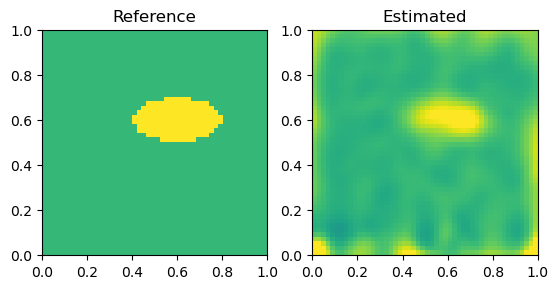

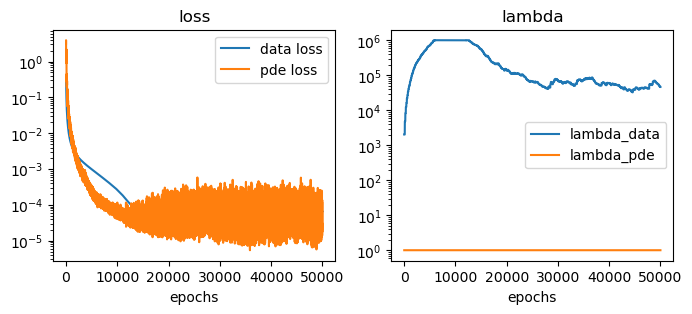

In [58]:
# Plot loss and lambda
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8, 3))
ax1.title.set_text('loss')
ax1.plot(loss_data_hist, label="data loss")
ax1.plot(np.asarray(loss_pde_hist)*np.asarray(lamb_pde_hist)/np.asarray(lamb_data_hist), label="pde loss")
# ax1.plot(np.asarray(loss_ini_hist)*np.asarray(lamb_ini_hist)/np.asarray(lamb_data_hist), label="initial cond. loss")
# ax1.plot(np.asarray(loss_bound_hist)*np.asarray(lamb_bound_hist)/np.asarray(lamb_data_hist), label="ABCs loss")

ax1.legend()
ax1.set_yscale("log")   
ax1.set_xlabel("epochs")
ax2.title.set_text('lambda')
ax2.plot(lamb_data_hist, label="lambda_data")
ax2.plot(lamb_pde_hist, label="lambda_pde")
# ax2.plot(lamb_ini_hist, label="lambda_ini")
# ax2.plot(lamb_bound_hist, label="lambda_abc")
ax2.legend()
ax2.set_yscale("log")   
ax2.set_xlabel("epochs")
plt.show()

In [61]:
# Plot reference and estimation
p_est = model_p(r_ref)
p_est = np.reshape(p_est.cpu().detach().numpy(), (-1, n_T))
p_max = np.max(np.abs(p_ref))
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(10, 5))
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated scattered field')
ax3.title.set_text('Estimated total field')

for i in range(0, n_T):   
    img1 = ax1.imshow(p_ref[:,:,i], vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img2 = ax2.imshow(np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    img3 = ax3.imshow(p_c0[:,:,i] + np.reshape(p_est[:,i], (n_L, n_L)), vmin = -p_max, vmax = p_max, origin='lower', cmap='seismic', extent=[-L/2,L/2,-L/2,L/2], animated=True)
    frames.append([img1, img2, img3])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

In [ ]:
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
frames = []
fig, (ax1, ax2) = plt.subplots(1,2)
ax1.title.set_text('Reference')
ax2.title.set_text('Estimated')
for i in range(0, len(c_hist)):   
    img1 = ax1.imshow(c_field, vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L])
    img2 = ax2.imshow(np.reshape(c_hist[i], (n_L, n_L)), vmin = 0, vmax = 1.5, origin='lower', cmap='viridis', extent=[0,L,0,L], animated=True)
    frames.append([img1, img2])
animation.ArtistAnimation(fig, frames, interval=200, blit=True)

We can see the inhomogeneity but still it's not really well recovered. It is interesting to see that shape of the estimated inhomogeneity is skewed toward the direction from where the wave is coming. Maybe multiple sources on different positions are needed for recovering the inhomogeneity shape correctly.